# Modeling HLN dataset using Neural Network 

这个教程将详细展示如何使用神经网络模型对人类淋巴结数据集(human_lymph_node)建模，包含具体的调参过程。

## 目录
* [数据预处理](#数据预处理)
  1. [读取数据](#读取数据)
* [制作数据集](#制作数据集)
  1. [标签与特征](#标签与特征)
  2. [划分数据集](#划分数据集)
* [模型比较](#模型比较)
* [模型评估](#模型评估)

## 数据预处理 <a class="anchor" id="数据预处理"></a>

首先，导入相关的库

In [1]:
import os
os.chdir("..")
import scanpy as sc
import numpy as np
import gc
import pickle


from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

# 导入自己编写的库
from datapre import DataProcess as DP
from datapre import Sample as SP
from model import nn_model
import evaluation as eval

sc.set_figure_params(facecolor = "white")
sc.settings.verbosity = 3
dirname = "human_lymph_node"

d:\anaconda3\envs\scanpy\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


设置默认的距离阈值为1.0

In [2]:
NEIGHBOR_DIS = 1.0

### 读取数据

标记线粒体基因，使用FeaturePlot函数可视化。

reading D:\work\data\V1_Human_Lymph_Node\filtered_feature_bc_matrix.h5
 (0:00:01)


d:\anaconda3\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


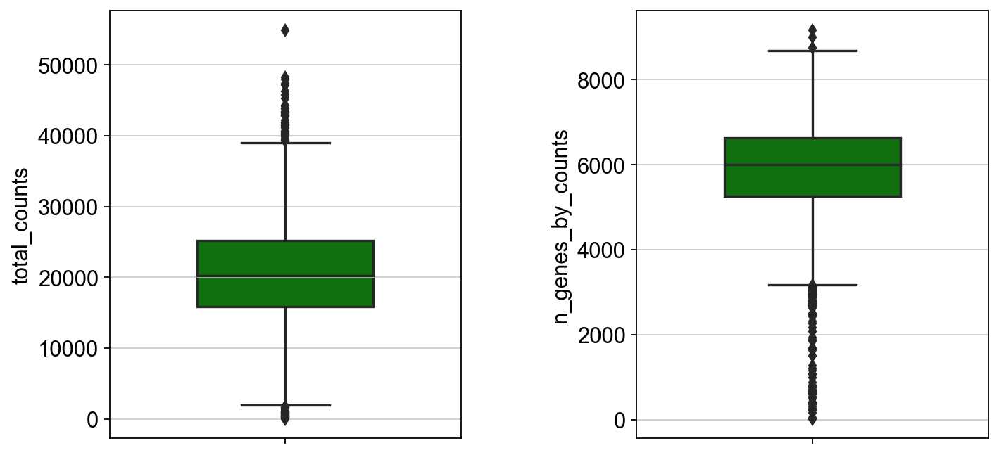

In [3]:
adata = sc.datasets.visium_sge(sample_id = "V1_Human_Lymph_Node")
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars = ["mt"], inplace = True)
DP.FeaturePlot(adata)

标准流程获取聚类结果

In [4]:
adata_copy = adata.copy()
sc.pp.normalize_total(adata_copy, inplace = True)
sc.pp.log1p(adata_copy)
sc.pp.highly_variable_genes(adata_copy, flavor = "seurat", n_top_genes = 2000)
sc.pp.pca(adata_copy)
sc.pp.neighbors(adata_copy)
sc.tl.umap(adata_copy)
sc.tl.leiden(adata_copy, key_added = "clusters")

adata.obs["clusters"] = adata_copy.obs.clusters
del adata_copy
gc.collect()

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)
running Leiden clustering
    finished: found 9 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


54089

过滤总表达量小于10的基因

In [5]:
sc.pp.filter_genes(adata, min_counts = 10)

filtered out 16767 genes that are detected in less than 10 counts


## 制作数据集

全局设置随机数种子

In [6]:
DP.setup_seed(38)

### 标签与特征

生成数据集标签

In [7]:
label_total, distance  = DP.CreateLabel(adata, neighbor_dis = NEIGHBOR_DIS)

运行SpaGene，识别空间可变基因

In [8]:
DP.adata2seurat(adata, "V1_Human_Lymph_Node")
! Rscript spagene.R V1_Human_Lymph_Node 1000
spagene = DP.find_Spa("data/V1_Human_Lymph_Node/spagene.txt")

Loading required package: ggplot2
Loading required package: patchwork


进行归一化、对数化、标准化

In [9]:
adata = DP.data_final(adata, spagene = spagene)
count = adata.to_df().values

normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


### 划分数据集

选择所有正样本，并按照1:2的比例抽取负样本

In [10]:
sample_index = SP.sample_data_index(label_total, neg_size = 2)
label, feature = SP.index2data(label_total, sample_index, count)

划分训练集和测试集

In [11]:
train_feature, train_label, test_feature, test_label = SP.split_dataset(label, feature)

train_feature = train_feature[:, 2:]
test_index = test_feature[:, [0,1]].astype("int32")
test_feature = test_feature[:, 2:]

## 模型比较

神经网络模型

第0轮，训练损失：0.4701
第0轮，验证损失：0.3980
Validation loss decreased (inf --> 0.398008).  Saving model ...
第1轮，训练损失：0.3907
第1轮，验证损失：0.3496
Validation loss decreased (0.398008 --> 0.349559).  Saving model ...
第2轮，训练损失：0.3612
第2轮，验证损失：0.3388
Validation loss decreased (0.349559 --> 0.338804).  Saving model ...
第3轮，训练损失：0.3415
第3轮，验证损失：0.3286
Validation loss decreased (0.338804 --> 0.328603).  Saving model ...
第4轮，训练损失：0.3214
第4轮，验证损失：0.3206
Validation loss decreased (0.328603 --> 0.320631).  Saving model ...
第5轮，训练损失：0.3090
第5轮，验证损失：0.3112
Validation loss decreased (0.320631 --> 0.311219).  Saving model ...
第6轮，训练损失：0.2930
第6轮，验证损失：0.3128
EarlyStopping counter: 1 out of 7
第7轮，训练损失：0.2856
第7轮，验证损失：0.3028
Validation loss decreased (0.311219 --> 0.302827).  Saving model ...
第8轮，训练损失：0.2746
第8轮，验证损失：0.3031
EarlyStopping counter: 1 out of 7
第9轮，训练损失：0.2633
第9轮，验证损失：0.3008
Validation loss decreased (0.302827 --> 0.300833).  Saving model ...
第10轮，训练损失：0.2558
第10轮，验证损失：0.3062
EarlyStopping counter: 1 out of

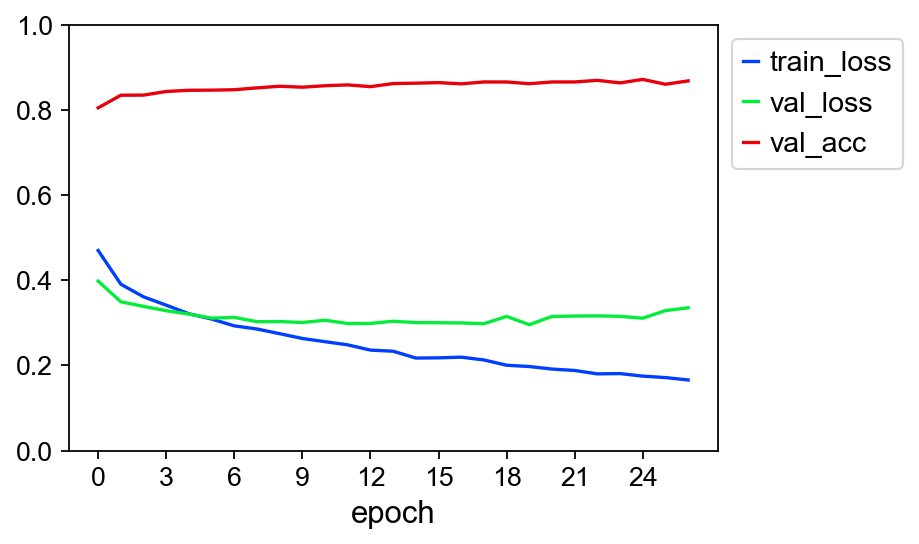

In [12]:
nnmodel = nn_model.NeuralNetworkClassifier(
    num_features = 200, 
    batch_size = 64,
    hidden_layer_sizes = [300, 100],
    dropout_rate = 0.5
)
nnmodel.fit(train_feature, train_label)
pred_nn = nnmodel.predict(test_feature)
predprob_nn = nnmodel.predict_proba(test_feature)
result_nn = eval.evaluate(test_label, pred_nn, predprob_nn, verbose = False)

xgboost 模型

In [13]:
start = int(train_feature.shape[1] / 2)
X = np.concatenate(
    (train_feature[:, :200], train_feature[:, start:(start + 200)]),
    1
)
test_X = np.concatenate(
    (test_feature[:, :200], test_feature[:, start:(start + 200)]),
    1
)

In [14]:
xgbmodel = XGBClassifier(
    learning_rate = 0.05,
    n_estimators = 1215,
    max_depth = 5,
    min_child_weight = 2,
    gamma = 1.5,
    colsample_bytree = 1.0,
    subsample = 0.9,
    objective = "binary:logistic"
)
xgbmodel.fit(X, train_label)
pred_xgb = xgbmodel.predict(test_X)
predprob_xgb = xgbmodel.predict_proba(test_X)
result_xgb = eval.evaluate(test_label, pred_xgb, predprob_xgb, verbose = False)

Random Forest 模型

In [15]:
start = int(train_feature.shape[1] / 2)
X = np.concatenate(
    (train_feature[:, :100], train_feature[:, start:(start + 100)]),
    1
)
test_X = np.concatenate(
    (test_feature[:, :100], test_feature[:, start:(start + 100)]),
    1
)

In [16]:
rfmodel = RandomForestClassifier(n_estimators = 260)
rfmodel.fit(X, train_label)
pred_rf = rfmodel.predict(test_X)
predprob_rf = rfmodel.predict_proba(test_X)
result_rf = eval.evaluate(test_label, pred_rf, predprob_rf, verbose = False)

根据少数特征构建xgboost模型

In [17]:
with open('human_lymph_node/selected_index.pkl', 'rb') as file:
    selected = pickle.load(file)

In [18]:
start = int(train_feature.shape[1] / 2)
train_feature_sel = np.concatenate(
    (train_feature[:, selected], train_feature[:, start + selected]),
    1
)
test_feature_sel = np.concatenate(
    (test_feature[:, selected], test_feature[:, start + selected]),
    1
)

In [19]:
selected_model = XGBClassifier(learning_rate = 0.05, n_estimators = 1300)
selected_model.fit(train_feature_sel, train_label)
pred_sel = selected_model.predict(test_feature_sel)
predprob_sel = selected_model.predict_proba(test_feature_sel)
result_sel = eval.evaluate(test_label, pred_sel, predprob_sel, verbose = False)

In [20]:
eval.model_compare(nnmodel = result_nn, xgbmodel = result_xgb, rfmodel = result_rf, selmodel = result_sel)

,Accuracy,Precision,Recall,MCC,F_Score,AUC,Average Precision
nnmodel,0.867,0.767,0.861,0.712,0.812,0.936,0.852
xgbmodel,0.857,0.787,0.782,0.677,0.784,0.928,0.851
rfmodel,0.785,0.794,0.481,0.491,0.599,0.890,0.782
selmodel,0.853,0.780,0.780,0.670,0.780,0.922,0.840


## 模型评估

误判样本可视化

In [50]:
from importlib import reload
reload(eval)

<module 'evaluation' from 'd:\\work\\evaluation.py'>

In [42]:
result_nn

{'Accuracy': 0.8666666666666667,
 'Precision': 0.7672479150871873,
 'Recall': 0.8612765957446809,
 'MCC': 0.7117543752660453,
 'F_Score': 0.8115477145148356,
 'AUC': 0.9355607062019013,
 'Average Precision': 0.8517882445545191,
 'confusion_matrix': array([[2043,  307],
        [ 163, 1012]], dtype=int64)}

C:\Users\我只是来搞笑的\AppData\Roaming\Python\Python39\site-packages\scanpy-1.9.1-py3.9.egg\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
C:\Users\我只是来搞笑的\AppData\Roaming\Python\Python39\site-packages\scanpy-1.9.1-py3.9.egg\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


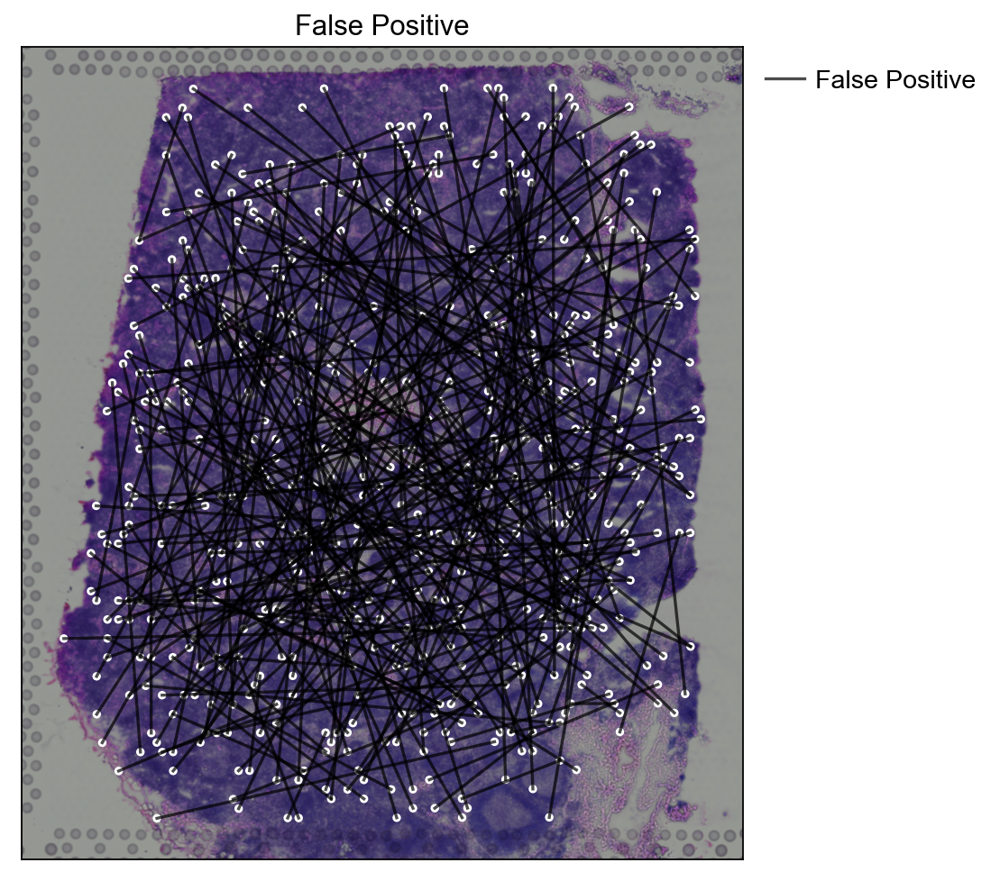

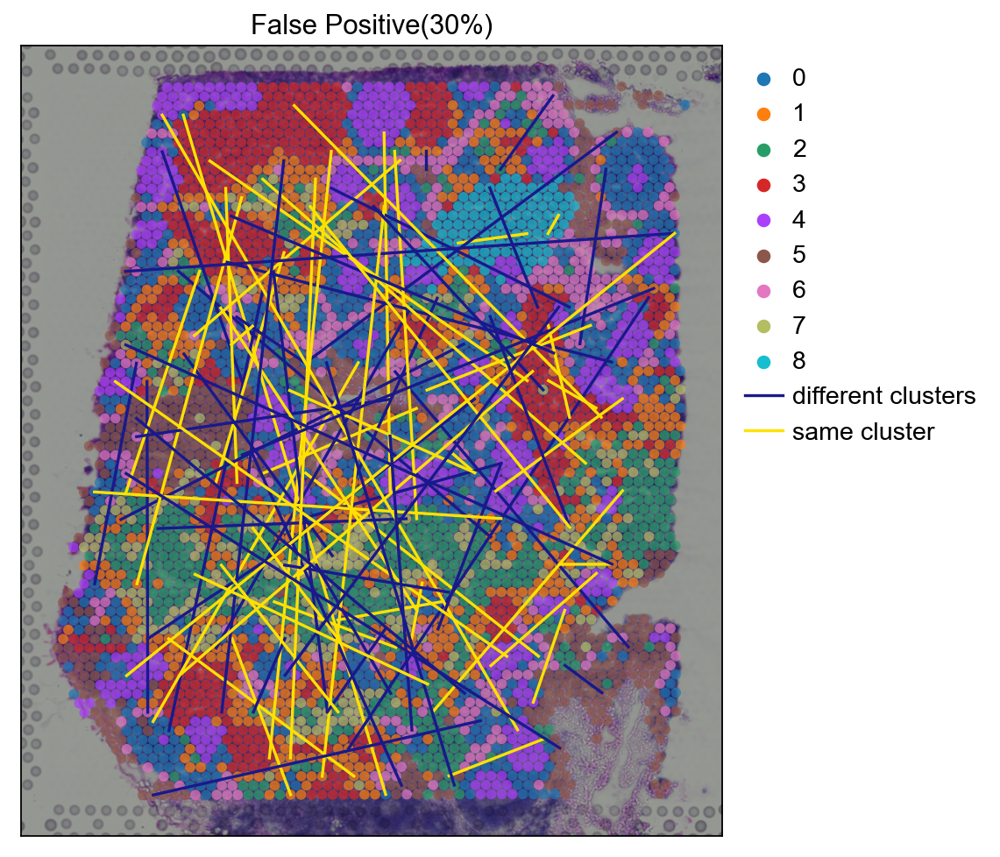

假正例中属于相同簇的点对占比为：45.0%


C:\Users\我只是来搞笑的\AppData\Roaming\Python\Python39\site-packages\scanpy-1.9.1-py3.9.egg\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
C:\Users\我只是来搞笑的\AppData\Roaming\Python\Python39\site-packages\scanpy-1.9.1-py3.9.egg\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


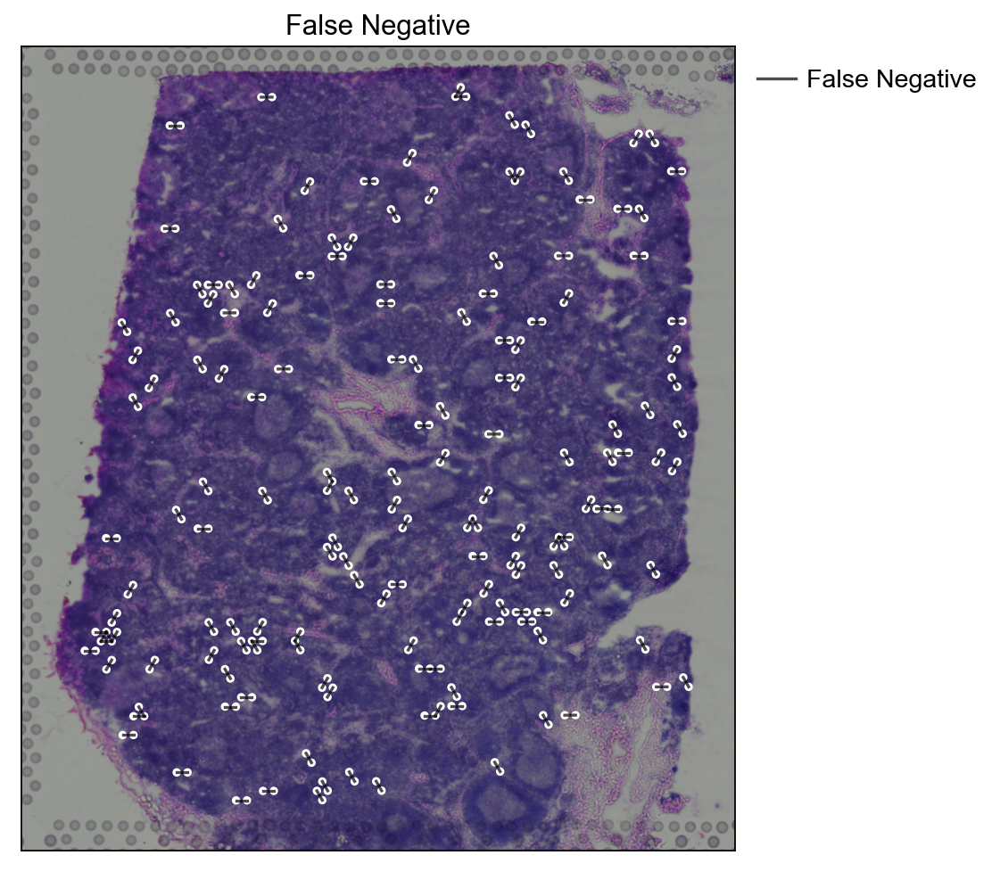

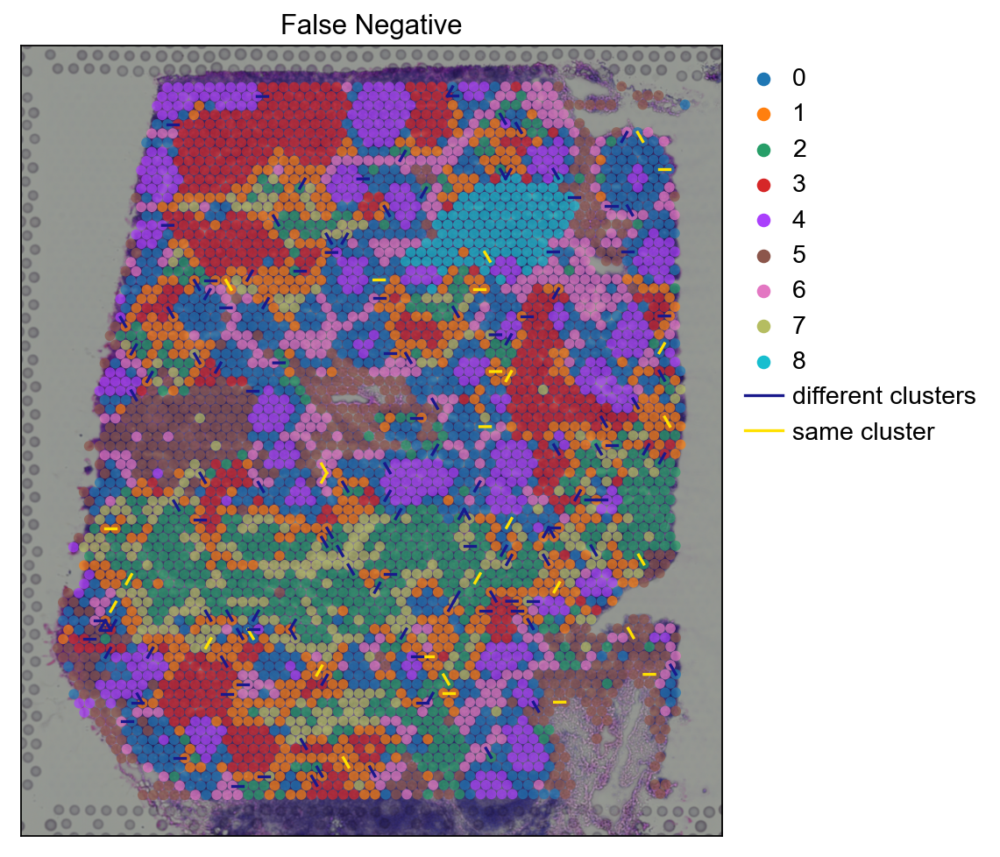

假负例中属于不同簇的点对占比为：81.6%


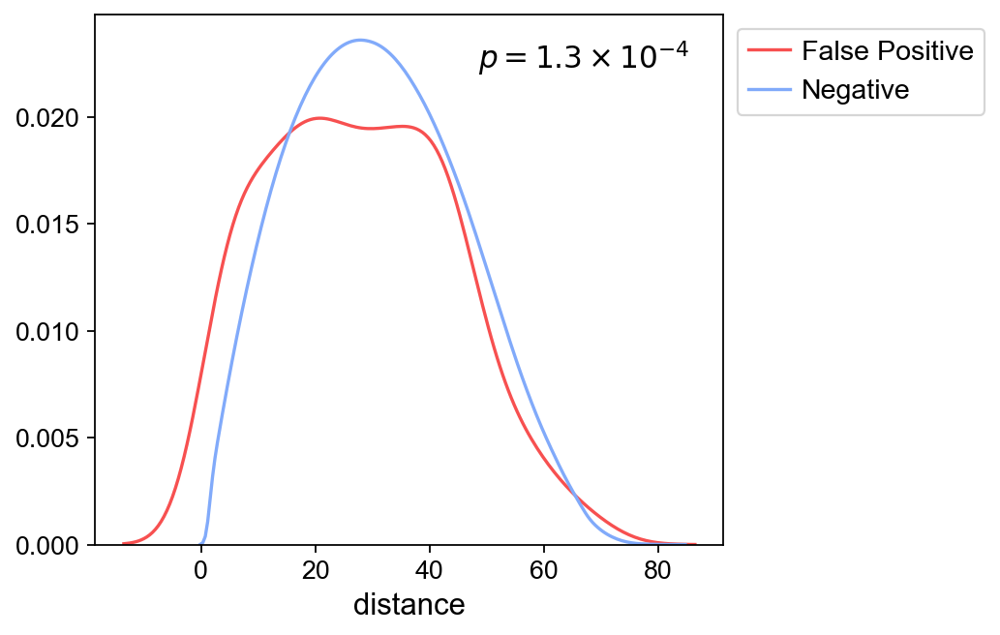

In [47]:
ratio = adata.uns["spatial"]['V1_Human_Lymph_Node']["scalefactors"]["tissue_hires_scalef"] 
eval.advance(pred_nn, test_label, test_index, adata, ratio, distance, neighbor_dis = NEIGHBOR_DIS,
             dirname = dirname)

不同群之间邻近的预测情况

In [34]:
result, _, is_diff = eval.edge_evaluate(test_label, pred_nn, predprob_nn, test_index, adata.obs["clusters"].copy())
result

{'Accuracy': 0.8829910887253003,
 'AUC': 0.9363199863199863,
 'Precision': 0.7096219931271478,
 'Recall': 0.7564102564102564,
 'MCC': 0.6580520669838488,
 'F1_Score': 0.7322695035460992,
 'confusion_matrix': array([[1866,  169],
        [ 133,  413]], dtype=int64)}

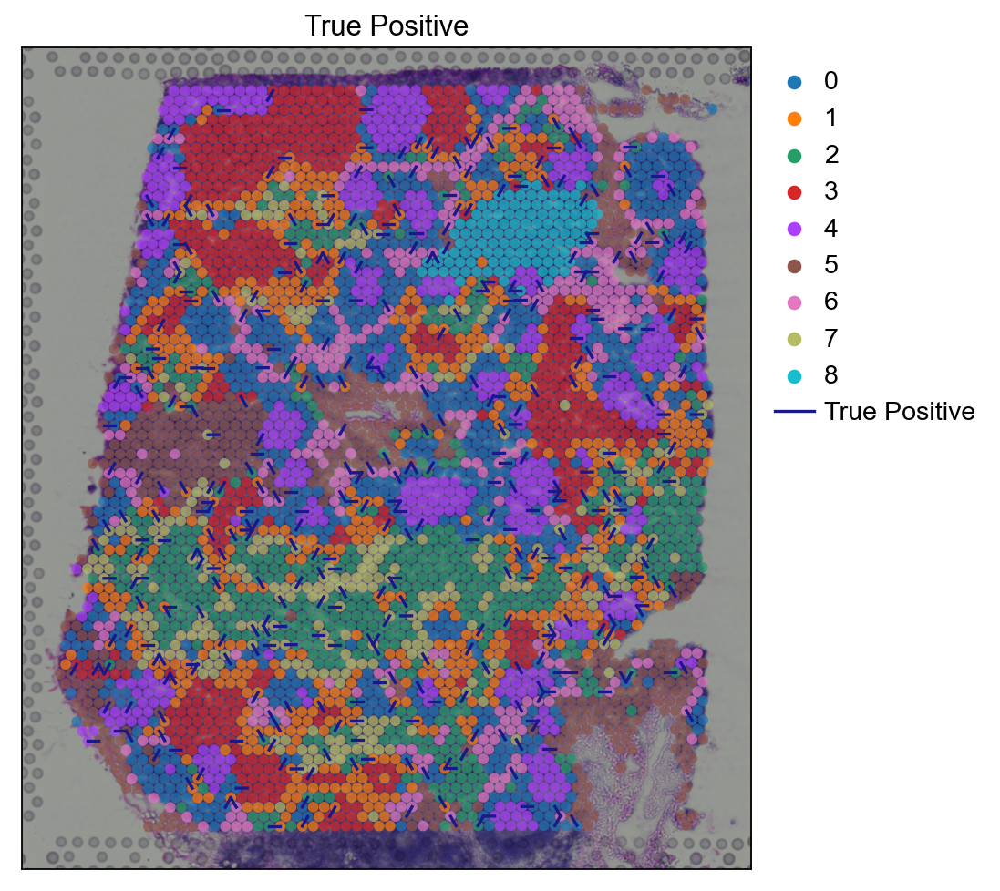

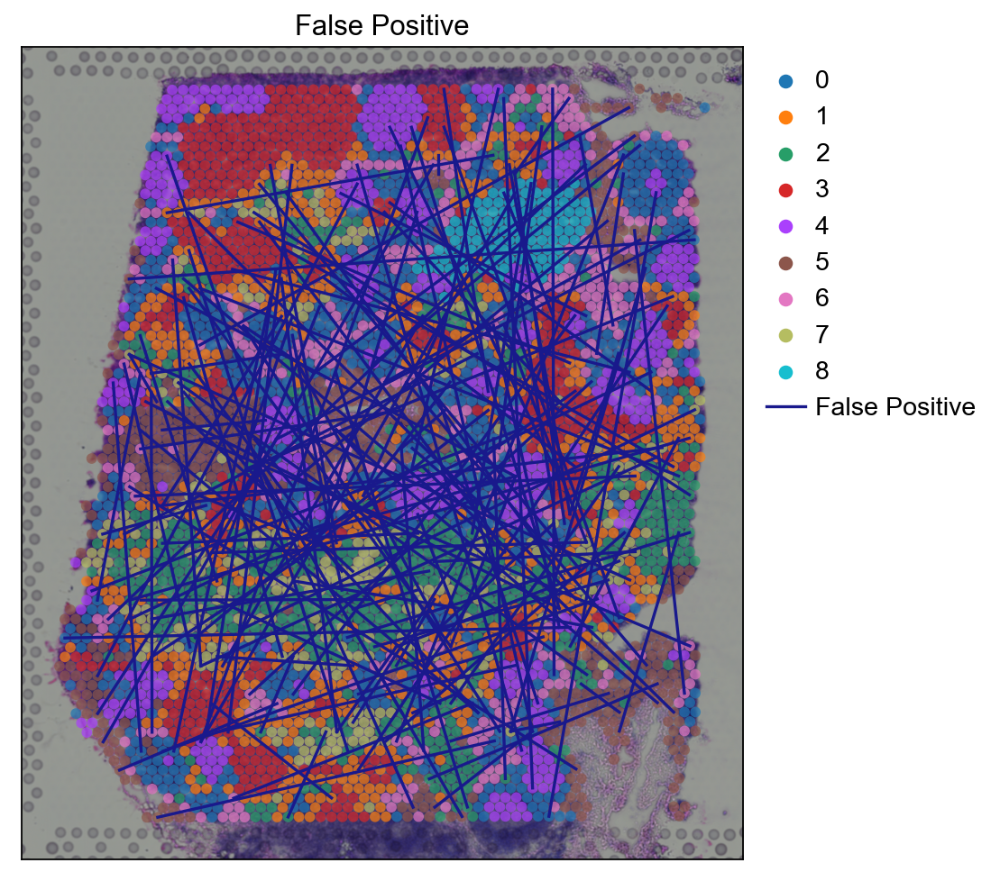

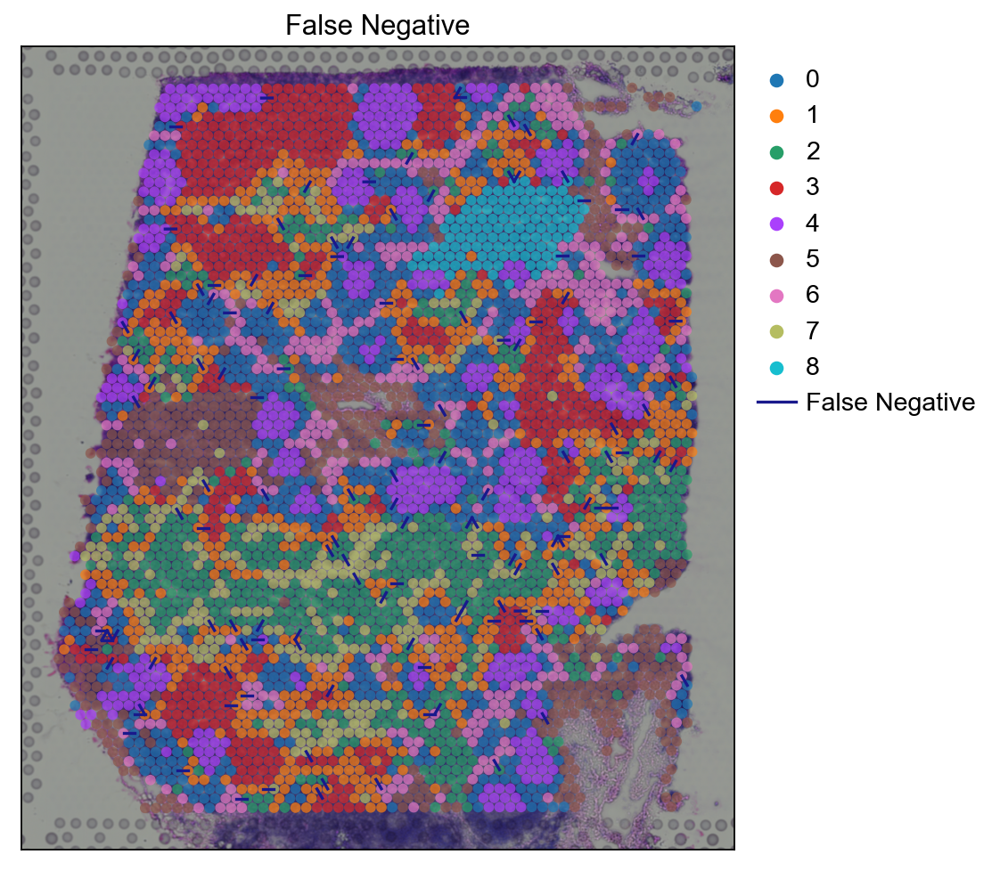

In [51]:
eval.edge_advance(is_diff, pred_nn, test_label, test_index, adata, ratio, dirname = dirname)

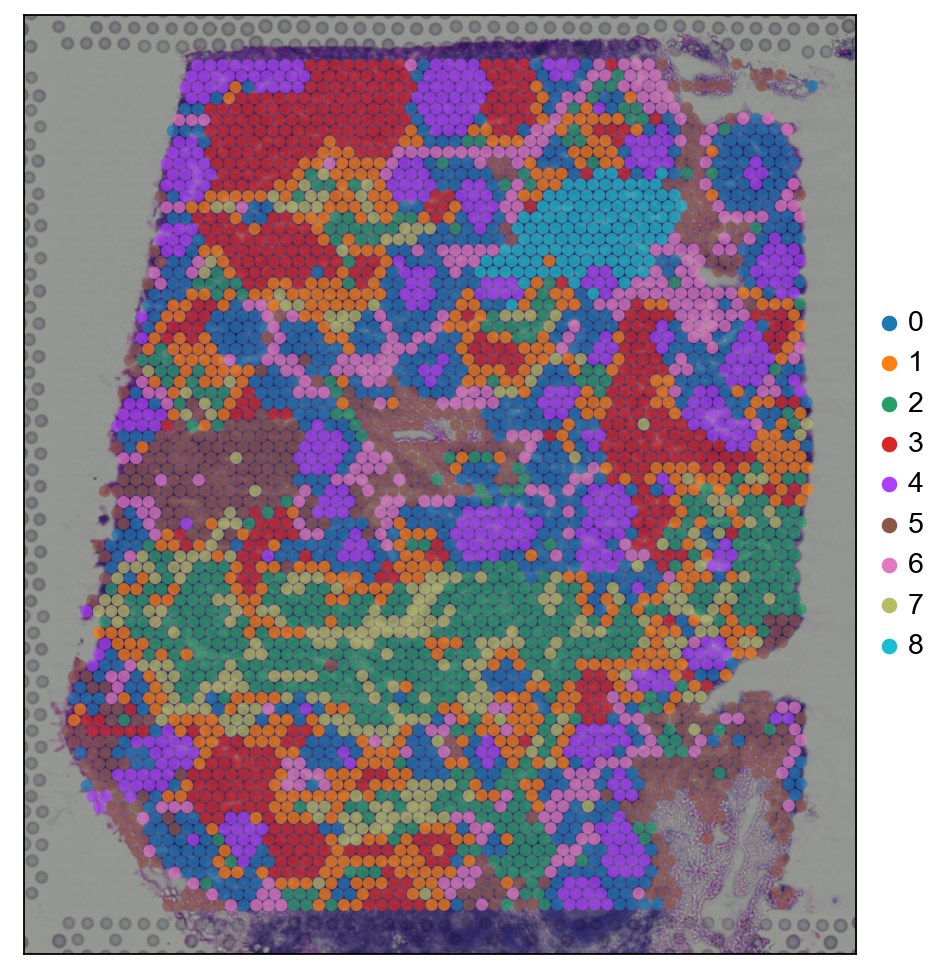

In [36]:
import matplotlib.pyplot as plt
_, ax = plt.subplots(constrained_layout = True, figsize = (8, 6))
sc.pl.spatial(adata, img_key = "hires", size = 1.5, alpha = 0.7, color = "clusters", title = "", show = False, ax = ax)
plt.xlabel("")
plt.ylabel("")
plt.savefig(dirname + "/HEimage.svg", bbox_inches = 'tight')